<a href="https://colab.research.google.com/github/Uyen02122003/Python-2/blob/main/Copy_of_T2_2025_MIS780_A1_Template.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## MIS780 Advanced AI For Business - Assessment 1 - T2 2025

**Student Name:** _enter your full name here_

**Student ID:** _enter your student ID here_

## Table of Content

1. [Executive Summary](#cell_executivesummary)


2. [Data Exploration](#cell_exploration)


3. [Sentiment Analysis](#cell_sentiment)


4. [Topic Modeling](#cell_TopicModeling)


5. [Practical Implication](#cell_PracticalImplication)


<a id = "cell_executivesummary"></a>
### 1. Executive Summary


#### NOTE: all the instructions and hints given in this template should be removed from your final submission. (Including this line)
**Aim:** To clearly articulate your understanding of the bussiness problem to management.

_Define your problem in business term. What is the aim of this project? What benefit will it generate to the business and its customers?_

_Present your proposed approaches._

_Present your major findings and explain how they help to address the business problem. Cross-reference with other report sections for support. Do not include chart or tables in this section._

<a id = "cell_exploration"></a>
### 2. Data Exploration

#### NOTE: You can create multiple Markdown and Code cells to present your work.
**Aim:** To demonstrate your understanding of data and report any insights emerging from data analysis

_Process and explore the characteristics of the attributes the provided data set._

_Use table or figure to support answering questions (A) and (B)_


<a id = "cell_LDA"></a>
Text Preprocessing

In [ ]:
import nltk
nltk.download('punkt')
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# code cell
import pandas as pd

df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/MIS780/Assignment 1/A1_dataset.csv")
df.head()

,AirlineName,CabinType,DateFlown,EntertainmentRating,FoodRating,GroundServiceRating,OriginCountry,OverallScore,Recommended,Review,SeatComfortRating,ServiceRating,Title,TravelType,ValueRating,WifiRating,unique_id
0,Aeroflot Russian Airlines,Economy Class,Jan-23,0,0,0,Greece,1,no,I had booked a flight from Greece to Cuba. Due...,0,0,travel to Russia to receive my refund,Solo Leisure,1,0,1
1,Aeroflot Russian Airlines,Economy Class,Jul-22,0,0,0,Ireland,1,no,Has your flight been cancelled by Aeroflot the...,0,0,waiting for a refund for last 2.5 years,Solo Leisure,1,0,2
2,Aeroflot Russian Airlines,Business Class,Jan-22,5,4,2,UnitedKingdom,5,no,Aeroflot has set high standards of achieving a...,5,2,felt very rushed and unpolished,Solo Leisure,2,3,3
3,Aeroflot Russian Airlines,Economy Class,Aug-21,0,5,5,RussianFederation,10,yes,"Best airline in Russia! Very nice staff, comfo...",5,5,Best airline in Russia,Business,5,5,4
4,Aeroflot Russian Airlines,Business Class,Sep-21,4,4,5,UnitedKingdom,10,yes,I was very impressed with the staff. Many than...,4,5,cabin crew were outstanding,Business,4,0,5


In [ ]:
# Once you have imported the original dataset (74000 reviews), save it to a dataframe (e.g. "df"). Then, use the following code snippet to take a random sample of 50000 reviews based on your student ID (e.g. "sample_df").
# Uncomment the below two lines and adjust the variable names of your choice.

seed = 224705349
sample_df = df.sample(n=50000, random_state=seed)

# Your entire analysis should be based on this unique 50000 airline review sample.

In [ ]:
sample_df = sample_df[~sample_df['Review'].isnull()]

# Define a function to clean text
def preprocess(ReviewText):
    ReviewText = ReviewText.str.replace(r'(<br/>)', ' ', regex=True)
    ReviewText = ReviewText.str.replace(r'(<a).*(>).*(</a>)', ' ', regex=True)
    ReviewText = ReviewText.str.replace(r'(&amp)', 'and', regex=True)
    ReviewText = ReviewText.str.replace(r'(&gt)|(&lt)', ' ', regex=True)
    ReviewText = ReviewText.str.replace(r'(\xa0)', ' ', regex=True)
    ReviewText = ReviewText.str.lower()                            # Lowercase
    ReviewText = ReviewText.str.replace(r'\d+', '', regex=True)    # Remove numbers
    ReviewText = ReviewText.str.replace(r'[^\w\s]', '', regex=True) # Remove punctuation
    ReviewText = ReviewText.str.replace(r'\s+', ' ', regex=True)   # Normalize whitespace
    ReviewText = ReviewText.str.strip()                            # Remove leading/trailing whitespace
    return ReviewText

# Apply cleaning
sample_df['Review'] = preprocess(sample_df['Review'])

# Create new features
sample_df['review_len'] = sample_df['Review'].astype(str).apply(len)
sample_df['word_count'] = sample_df['Review'].apply(lambda x: len(str(x).split()))

# Format DateFlown column
sample_df['DateFlown'] = pd.to_datetime(sample_df['DateFlown'], format='%b-%y')
sample_df = sample_df.sort_values('DateFlown')
sample_df.head()


,AirlineName,CabinType,DateFlown,EntertainmentRating,FoodRating,GroundServiceRating,OriginCountry,OverallScore,Recommended,Review,SeatComfortRating,ServiceRating,Title,TravelType,ValueRating,WifiRating,unique_id,review_len,word_count
53443,Singapore Airlines,Economy Class,2013-03-01,3,5,5,Switzerland,10,yes,zürich to singapore in march as i do my bookin...,5,5,all three seats were free,Solo Leisure,5,0,53444,467,89
53444,Singapore Airlines,Economy Class,2013-04-01,3,5,5,Switzerland,10,yes,singapore to zurich in may in april to my know...,4,5,there is a lot of legroom,Couple Leisure,5,0,53445,519,100
44573,Lufthansa,Business Class,2014-07-01,3,4,4,Canada,7,yes,overall rating of the lufthansa business class...,5,3,Lufthansa customer review,Business,1,2,44574,305,49
1807,Aeroflot Russian Airlines,Economy Class,2014-07-01,2,4,3,UnitedStates,7,yes,good value for money although aircraft itself ...,1,5,Aeroflot Russian Airlines customer review,Family Leisure,4,1,1808,115,21
15616,American Airlines,Economy Class,2014-07-01,0,0,1,Chile,3,no,the seats were uncomfortable service was a str...,2,1,American Airlines customer review,Family Leisure,2,0,15617,293,54


In [ ]:
sample_df.describe()

In [ ]:
sample_df.shape
sample_df.info()

In [ ]:
sample_df.isnull().sum()

A. Top 10 overall Rating across various cabin types

- Do this airlines consistenly rank in the top 10 for entertainment, food and ground service
- Does "Quantas Airways" or "Jestar Airways" appear in any of above the top 10 lists
- Whether Quantas or Jestar is one of the most recommend (top 10) or the least recommend for anycabin type


In [ ]:
from matplotlib import pyplot

1. Top 10 Overall Rating across cabin types

=> Use Overall score for this one

In [ ]:
# Count total reviews per airline
review_counts = sample_df.groupby('AirlineName')['unique_id'].nunique().reset_index(name='TotalReviews')
eligible_airlines = review_counts[review_counts['TotalReviews'] >= 100]['AirlineName']

# Filter original DataFrame to only those airlines
filtered_df = sample_df[sample_df['AirlineName'].isin(eligible_airlines)]

# Group by Airline and CabinType, compute mean rating
cabin_rating = filtered_df.groupby(['AirlineName', 'CabinType'])['OverallScore'].mean().reset_index()

# Average across all cabin types per airline
overall_avg = cabin_rating.groupby('AirlineName')['OverallScore'].mean()

# Get top and bottom 10
top10 = overall_avg.sort_values(ascending=False).head(10)
bottom10 = overall_avg.sort_values().head(10)

# Print top 10 airlines
print("Top 10 Airlines by Overall Rating (All Cabin Types, ≥100 Reviews):")
print(top10)

# Print bottom 10 airlines
print("\nBottom 10 Airlines by Overall Rating (All Cabin Types, ≥100 Reviews):")
print(bottom10)

# Plotting
pyplot.figure(figsize=(8, 4))

# Top 10 plot
pyplot.subplot(1, 2, 1)
pyplot.bar(top10.index, top10.values, color='orange', width=0.6)
pyplot.title('Top 10 Airlines by Rating')
pyplot.xlabel('Airline Name')
pyplot.ylabel('Average Overall Score')
pyplot.xticks(rotation=45)

# Bottom 10 plot
pyplot.subplot(1, 2, 2)
pyplot.bar(bottom10.index, bottom10.values, color='purple', width=0.6)
pyplot.title('Bottom 10 Airlines by Rating')
pyplot.xlabel('Airline Name')
pyplot.ylabel('Average Overall Score')
pyplot.xticks(rotation=45)

pyplot.tight_layout()
pyplot.show()


2. Do these airlines
consistently rank in the top 10 for entertainment, food and ground services as well?

In [ ]:
# Group by Airline and CabinType, compute mean for each service metric
cabin_service = sample_df.groupby(['AirlineName', 'CabinType'])[
    ['EntertainmentRating', 'FoodRating', 'GroundServiceRating']
].mean().reset_index()

# Average across all cabin types per airline
service_avg = cabin_service.groupby('AirlineName')[[
    'EntertainmentRating', 'FoodRating', 'GroundServiceRating'
]].mean()

# Get top 10 airlines for each metric
top10_entertainment = service_avg['EntertainmentRating'].sort_values(ascending=False).head(10)
top10_food = service_avg['FoodRating'].sort_values(ascending=False).head(10)
top10_ground = service_avg['GroundServiceRating'].sort_values(ascending=False).head(10)

# Print Top 10s
print("Top 10 Airlines by Entertainment Rating (All Cabin Types):")
print(top10_entertainment)

print("\nTop 10 Airlines by Food Rating (All Cabin Types):")
print(top10_food)

print("\nTop 10 Airlines by Ground Service Rating (All Cabin Types):")
print(top10_ground)

# Plot all three
pyplot.figure(figsize=(12, 12))

# Entertainment
pyplot.subplot(3, 1, 1)
pyplot.bar(top10_entertainment.index, top10_entertainment.values, color='skyblue', width=0.6)
pyplot.title('Top 10 Airlines by Entertainment Rating')
pyplot.ylabel('Average Entertainment Rating')
pyplot.xticks(rotation=45)

# Food
pyplot.subplot(3, 1, 2)
pyplot.bar(top10_food.index, top10_food.values, color='lightgreen', width=0.6)
pyplot.title('Top 10 Airlines by Food Rating')
pyplot.ylabel('Average Food Rating')
pyplot.xticks(rotation=45)

# Ground Service
pyplot.subplot(3, 1, 3)
pyplot.bar(top10_ground.index, top10_ground.values, color='salmon', width=0.6)
pyplot.title('Top 10 Airlines by Ground Service Rating')
pyplot.ylabel('Average Ground Service Rating')
pyplot.xticks(rotation=45)

pyplot.tight_layout()
pyplot.show()

Add code for data exploration
-

3. Does “Qantas Airways” or “Jetstar
Airways” appear in any of the above top 10 lists?

=> No

4. Additionally, your client would like to know whether
“Qantas Airways” or “Jetstar Airways” is one of the most recommended (top 10) or the least
recommended (bottom 10) airlines for any cabin type

In [ ]:
# Loop through each cabin type
for cabin in sample_df['CabinType'].unique():
    print(f"\n📘 Cabin Type: {cabin}")

    # Filter data for the current cabin
    cabin_df = sample_df[sample_df['CabinType'] == cabin]

    #Total reviews per airline
    total_reviews = cabin_df.groupby('AirlineName')['unique_id'].nunique().reset_index(name='TotalReviews')

    #"yes" recommendations per airline
    yes_reviews = cabin_df[cabin_df['Recommended'] == 'yes'].groupby('AirlineName')['unique_id'].nunique().reset_index(name='YesCount')

    # Merge both tables
    summary = pd.merge(total_reviews, yes_reviews, on='AirlineName', how='left')
    summary['YesCount'] = summary['YesCount'].fillna(0).astype(int)
    summary['RecommendRate (%)'] = (summary['YesCount'] / summary['TotalReviews']) * 100

    #Filter airlines with at least 100 total reviews
    summary_filtered = summary[summary['TotalReviews'] >= 100]

    # Sort and get top/bottom 10
    top10 = summary_filtered.sort_values(by='RecommendRate (%)', ascending=False).head(10)
    bottom10 = summary_filtered.sort_values(by='RecommendRate (%)', ascending=True).head(10)

    # Print results
    print("\n Top 10 Airlines by Recommend Percentage (≥100 Reviews):")
    print(top10[['AirlineName', 'TotalReviews', 'YesCount', 'RecommendRate (%)']])

    print("\n Bottom 10 Airlines by Recommend Percentage (≥100 Reviews):")
    print(bottom10[['AirlineName', 'TotalReviews', 'YesCount', 'RecommendRate (%)']])


B. How have overall passenger ratings for “Qantas Airways” changed over time compared to the top 5
rated airlines? Are there any noticeable trends or patterns in the variation of overall ratings over time
for “Qantas Airways” and the other top five-rated airlines? Discuss any possible factors that may have
influenced the above trends

1. How have overall passenger ratings for “Qantas Airways” changed over time compared to the top 5 rated airlines?

In [ ]:
cabin_rating = filtered_df.groupby(['AirlineName', 'CabinType'])['OverallScore'].mean().reset_index()
overall_avg = cabin_rating.groupby('AirlineName')['OverallScore'].mean().sort_values(ascending=False)

#Top 5 airlines by average rating (excluding Qantas)
top5_airlines = overall_avg.drop('Qantas Airways', errors='ignore').head(5).index.tolist()

#Compare top 5 with Quantas
selected_airlines = top5_airlines + ['Qantas Airways']

#Extract year for trend analysis
sample_df['DateFlown'] = pd.to_datetime(df['DateFlown'], format='%b-%y', errors='coerce')
sample_df['Year'] = sample_df['DateFlown'].dt.year
trend_df = sample_df[df['AirlineName'].isin(selected_airlines)]

#Group by Year and Airline, calculate average rating
yearly_avg = (
    trend_df.groupby(['Year', 'AirlineName'])['OverallScore']
    .mean()
    .reset_index()
    .dropna()
)

#Plot the trend line graph
pyplot.figure(figsize=(12, 6))
for airline in selected_airlines:
    data = yearly_avg[yearly_avg['AirlineName'] == airline]
    pyplot.plot(data['Year'], data['OverallScore'], marker='o', label=airline)

pyplot.title('Average Overall Ratings Over Years: Qantas Airways vs Top 5 Airlines')
pyplot.xlabel('Year')
pyplot.ylabel('Average Overall Rating')
pyplot.grid(True, axis='y')
pyplot.legend(title='Airline')
pyplot.tight_layout()
pyplot.show()

2. Are there any noticeable trends or patterns in the variation of overall ratings over time for “Qantas Airways” and the other top five-rated airlines?

To discover the patterns in the variation of overall ratings over time for the top 5 and the Quantas Airways, box plots were created

In [ ]:
import seaborn as sns

# Create 6 box plots (1 per airline)
fig, axs = pyplot.subplots(2, 3, figsize=(18, 10), sharey=True)
axs = axs.flatten()

# Iterate through each selected airline
for i, airline in enumerate(selected_airlines):
    airline_data = sample_df[(sample_df['AirlineName'] == airline) & (sample_df['Year'].notna())]
    sns.boxplot(data=airline_data, x='Year', y='OverallScore', ax=axs[i])
    axs[i].set_title(airline)
    axs[i].set_xlabel('Year')
    axs[i].set_ylabel('Overall Rating')

# Adjust layout
pyplot.suptitle('Variation in Overall Ratings Over Years (One Box Plot per Airline)', fontsize=16)
pyplot.tight_layout(rect=[0, 0, 1, 0.96])
pyplot.show()



Qantas Airways shows a clear decline in overall ratings over time, with both the median rating decreasing and the spread (variation) increasing—especially after 2018. In contrast, the top five-rated airlines (like Hainan Airlines, ANA, and EVA Air) tend to maintain consistently high median ratings with less fluctuation, indicating stronger and more stable passenger satisfaction. Qantas's wider interquartile range and more outliers in recent years suggest increased customer dissatisfaction or inconsistency in service delivery over time.

<a id = "cell_sentiment"></a>
### 3. Sentiment Analysis

**Aim:** To demonstrate your understanding in sentiment analysis.

_Use sentiment analysis to answer question (C) and (D)._

#### Lexicon-based Sentiment Analysis

In [ ]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

# Apply sentiment analysis to each review
sentiment_scores = sample_df['Review'].apply(sid.polarity_scores)

# Convert the sentiment scores (which are dicts) into separate columns
sentiment_df = sentiment_scores.apply(pd.Series)
sample_df = pd.concat([sample_df, sentiment_df], axis=1)

# Classify sentiment based on compound score
def classify_sentiment(score):
    if score > 0.2:
        return 'Positive'
    elif score < -0.2:
        return 'Negative'
    else:
        return 'Neutral'

# Apply function correctly
sample_df['SentimentLabel'] = sample_df['compound'].astype(float).apply(classify_sentiment)

# Show a sample of 10 reviews with all sentiment information
print(sample_df[['Review', 'compound', 'pos', 'neu', 'neg', 'SentimentLabel']].sample(10, random_state=1))

#### C. Compare the overall sentiments expressed by customers about airlines. Which airline received the most positive sentiments? ####

##### C1. Overall sentiments expressed by customers about airlines

In [ ]:
# Display sentiment distribution
sample_df['SentimentLabel'].value_counts().plot(kind='bar', color=['lightgreen', 'gold', 'coral'])
plt.title('Part C: Overall Sentiment Distribution')
plt.xlabel('Sentiment')
plt.ylabel('Number of Reviews')
plt.grid(axis='y')
plt.show()

In [ ]:
# Average sentiment per airline
airline_avg_sentiment = sample_df.groupby('AirlineName')['compound'].mean().sort_values(ascending=False)
most_positive_airline = airline_avg_sentiment.idxmax()
print('Part C - Airline with highest average sentiment:', most_positive_airline)

# Plot average sentiment by airline
airline_avg_sentiment.plot(kind='bar', color='skyblue', figsize=(12, 6))
plt.title('Part C: Average Sentiment Score by Airline')
plt.ylabel('Average Sentiment Score')
plt.grid(axis='y')
plt.show()

##### C2. Which airlines received the most positive sentiments?

In [ ]:
# Sentiment counts and proportions
sentiment_counts = sample_df.groupby(['AirlineName', 'SentimentLabel']).size().unstack(fill_value=0)
sentiment_counts['TotalReviews'] = sentiment_counts.sum(axis=1)
sentiment_counts['PositiveRatio'] = sentiment_counts['Positive'] / sentiment_counts['TotalReviews']
sentiment_counts['NegativeRatio'] = sentiment_counts['Negative'] / sentiment_counts['TotalReviews']
sentiment_counts['NeutralRatio'] = sentiment_counts['Neutral'] / sentiment_counts['TotalReviews']


In [ ]:
# Rankings
positive_ranking = sentiment_counts.sort_values(by='Positive', ascending=False)
print("Airlines Ranked by Positive Review Count:")
print(positive_ranking[['Positive']])

positive_ratio_ranking = sentiment_counts.sort_values(by='PositiveRatio', ascending=False)
print("Airlines Ranked by Positive Review Proportion:")
print(positive_ratio_ranking[['PositiveRatio']])



D. Identify the airline that received the most positive sentiment for their Economy class and Business
Class “service/s”.

In [ ]:
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import pandas as pd

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

# Function to detect aspect sentiment
def aspect_sentiment(text, aspect="service"):
    if pd.isna(text):
        return False
    tokens = word_tokenize(text.lower())
    if aspect not in ' '.join(tokens):
        return False
    score = sid.polarity_scores(text)
    return score['compound'] > 0.1  # classify as positive

# Apply aspect-level sentiment per review
sample_df['Is_Service_Positive'] = sample_df.apply(
    lambda row: aspect_sentiment(row['Review'], "service") if pd.notna(row['Review']) else False,
    axis=1
)

# Aggregate counts by airline and cabin type
service_summary = sample_df.groupby(['AirlineName', 'CabinType'])['Is_Service_Positive'].agg(
    positive_service_count='sum',
    total_reviews='size'
).reset_index()

# Filter for Economy and Business class
economy_service = service_summary[service_summary['CabinType'] == 'Economy Class']
business_service = service_summary[service_summary['CabinType'] == 'Business Class']

# Sort top airlines by positive service count
top_10_economy = economy_service.sort_values(by='positive_service_count', ascending=False).head(10)
top_10_business = business_service.sort_values(by='positive_service_count', ascending=False).head(10)

# Print results
print("Top 10 Airlines by Positive Service Reviews for Economy Class:")
print(top_10_economy[['AirlineName', 'positive_service_count', 'total_reviews']].to_string(index=False))

print("\nTop 10 Airlines by Positive Service Reviews for Business Class:")
print(top_10_business[['AirlineName', 'positive_service_count', 'total_reviews']].to_string(index=False))


In [ ]:
# Calculate ratio
service_summary['positive_ratio'] = service_summary['positive_service_count'] / service_summary['total_reviews']

# Best by ratio
best_eco = service_summary[(service_summary['CabinType'] == 'Economy Class')].sort_values(by='positive_ratio', ascending=False).iloc[0]
best_bus = service_summary[(service_summary['CabinType'] == 'Business Class')].sort_values(by='positive_ratio', ascending=False).iloc[0]

print(f"Most Positive Airline for 'Service' in Economy Class: {best_eco['AirlineName']} ({best_eco['positive_ratio']:.2f})")
print(f"Most Positive Airline for 'Service' in Business Class: {best_bus['AirlineName']} ({best_bus['positive_ratio']:.2f})")


Most Positive Airline for 'Service' in Economy Class: ANA All Nippon Airways (0.53)
Most Positive Airline for 'Service' in Business Class: China Airlines (0.74)


In [ ]:
import matplotlib.pyplot as plt

# Prepare the data
eco_plot = service_summary[service_summary['CabinType'] == 'Economy Class'].sort_values(by='positive_ratio', ascending=True).tail(10)
bus_plot = service_summary[service_summary['CabinType'] == 'Business Class'].sort_values(by='positive_ratio', ascending=True).tail(10)

# Create side-by-side bar charts
fig, axs = plt.subplots(1, 2, figsize=(16, 6), sharey=True)

axs[0].barh(eco_plot['AirlineName'], eco_plot['positive_ratio'], color='green')
axs[0].set_title('Economy Class - Positive Service Ratio')
axs[0].set_xlabel('Positive Sentiment Ratio')
axs[0].invert_yaxis()
axs[0].grid(True, axis='x')

axs[1].barh(bus_plot['AirlineName'], bus_plot['positive_ratio'], color='blue')
axs[1].set_title('Business Class - Positive Service Ratio')
axs[1].set_xlabel('Positive Sentiment Ratio')
axs[1].invert_yaxis()
axs[1].grid(True, axis='x')

plt.tight_layout()
plt.show()


<a id = "cell_TopicModeling"></a>
### 4. Topic Modeling

**Aim:** To demonstrate your understanding in topic modeling.

_Use text-processing techniques to process and prepare textual data for topic modelling._

_Use LDA to explore topics discussed in the text reviews._

_Carry out experiments and demonstrate how an appropriate topic number is determined for your model._

_Interpret the discovered topics and answer question (E) and (F)._


#### Text Processing ####

In [ ]:
from nltk.stem import PorterStemmer
import re
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

# Initialize stemmer and stop words
porter = PorterStemmer()
stop_words = set(stopwords.words('english'))

# Use your actual text column (here, assuming sample_df['Review'])
documents = sample_df['Review']
Cleaned_doc = []

for r in range(len(documents)):
    review = documents.iloc[r]  # ✅ FIXED here
    try:
        review = re.sub('[^A-Za-z]', ' ', review)
        review = review.lower()
        Tokens = review.split()
        Filtered_token = [w for w in Tokens if len(w) > 3]
        review = ' '.join(Filtered_token)
    except:
        continue
    Cleaned_doc.append(review)
    print('-[Review Text]:', review)


In [ ]:
# STEP 2: Remove stopwords from Cleaned_doc
for r in range(len(Cleaned_doc)):
    each_item = []
    for t in Cleaned_doc[r].split():
        if t not in stop_words:
            each_item.append(t)
    Cleaned_doc[r] = ' '.join(each_item)
    print('-[Cleaned Text]:', Cleaned_doc[r])


#### Latent Dirichlet Allocation ####

We use LDA (Latent Dirichlet Allocation) for parts E and F because it is a powerful unsupervised topic modeling technique that uncovers the underlying themes or topics within a collection of reviews.

##### Term Document Matrix #####

We use TDM to transform unstructured text reviews into structured data by reprensting the frequency of terms across documents
=> Identify pattern of word co-occurence, enable the extraction of laten topics discussed by passengers in their reviews.

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

count_vectorizer = CountVectorizer()# Fit and transform the processed titles

count_data = count_vectorizer.fit_transform(Cleaned_doc)
count_data

<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 2651671 stored elements and shape (50000, 44386)>

Visualise the most common words

In [ ]:
import numpy as np

#Retrieve the words found by CountVectorizer
terms = count_vectorizer.get_feature_names_out()

# Count the popularity of words
# Create a NumPy array of zeroes to store total word counts, one for each word in terms
total_counts = np.zeros(len(terms))

#Sum the frequencies across all documents, loop through each document vector and adds up the words frequencies
for t in count_data:
    total_counts+=t.toarray()[0]

# zip function => pair the value in terms with the one in total count
count_dict = (zip(terms, total_counts))

#sort
count_dict = sorted(count_dict, key=lambda x:x[1], reverse=True)[0:40] #Take the top 40 words


words = [w[0] for w in count_dict]
counts = [w[1] for w in count_dict]
x_pos = np.arange(len(words))

pyplot.figure(2, figsize=(11, 3))
pyplot.subplot(title='40 most common words')
pyplot.bar(words, counts)
pyplot.xticks(x_pos, words, rotation=90)
pyplot.xlabel('words')
pyplot.ylabel('counts')
pyplot.show()

In [ ]:
#Remove highly frequent (Greater than 20%) and infrequent words (less than 1%)
# % of the documents

keepIndex = [];
for t in range(len(total_counts)):
    if total_counts[t] < 10000 and total_counts[t] > 500:
        keepIndex.append(t)

print('Number of Terms Remained: ', len(keepIndex))

#Save the remain ing term and frequency data
ReducedTerm = [terms[t] for t in keepIndex] #only the terms that passed the frequency filter
ReducedCount = count_data[:,keepIndex]
ReducedCount

Number of Terms Remained:  1059


<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 1584435 stored elements and shape (50000, 1059)>

##### LDA Modeling #####

In [ ]:
from sklearn.decomposition import LatentDirichletAllocation as LDA

# Tweak the two parameters below
number_topics = 5

lda = LDA(n_components=number_topics, n_jobs=-1, random_state=2023)
#n_components=number_topics: set the num of topics LDA discover
#n_jobs=-1: CPU cores to use during training => -1: all available cores

lda.fit(ReducedCount)
#Trained LDA model
lda.components_ #each row represents a topic and contains the unormalised word distribution.


In [ ]:
lda.components_.shape

(5, 1059)

<a id = "cell_WordProbabilities"></a>
#####  Word Probabilities by Topic

In [ ]:
Word_Topics_Pro = lda.components_ / lda.components_.sum(axis=1)[:, np.newaxis]
print(Word_Topics_Pro)

In [ ]:
for topic_idx, topic in enumerate(Word_Topics_Pro):
    print("\nTopic #%d:" % topic_idx)
    count_dict = (zip(ReducedTerm, topic))
    count_dict = sorted(count_dict, key=lambda x:x[1], reverse=True)[0:5]
    for w in count_dict:
        print(w[0], ': {0:.3f}'.format(w[1]))


Topic #0:
great : 0.016
entertainment : 0.015
comfortable : 0.014
friendly : 0.012
excellent : 0.010

Topic #1:
meal : 0.015
economy : 0.010
served : 0.010
drinks : 0.009
lounge : 0.009

Topic #2:
cancelled : 0.014
refund : 0.013
ticket : 0.013
days : 0.012
call : 0.011

Topic #3:
gate : 0.020
minutes : 0.015
delay : 0.011
said : 0.011
next : 0.010

Topic #4:
dont : 0.012
worst : 0.011
united : 0.011
flying : 0.011
spirit : 0.010


In [ ]:
# View full Word Probabilities by Topic Matrix
df_topic_keywords = pd.DataFrame(Word_Topics_Pro)
df_topic_keywords.columns = ReducedTerm
df_topic_keywords

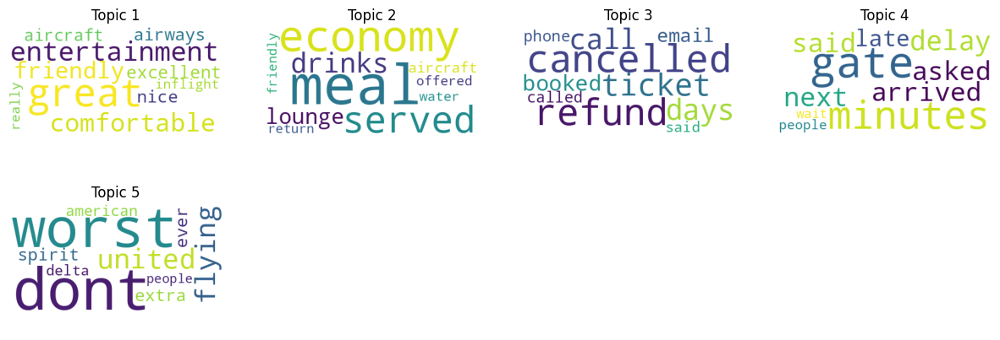

In [ ]:
#!pip install wordcloud

from wordcloud import WordCloud
import math
rows = math.ceil(len(Word_Topics_Pro)/4)
fig, ax = pyplot.subplots(rows, 4, figsize=(15,2.5*rows))
[axi.set_axis_off() for axi in ax.ravel()]
for topic_idx, topic in enumerate(Word_Topics_Pro):
    count_dict = (zip(ReducedTerm, topic))
    count_dict = sorted(count_dict, key=lambda x:x[1], reverse=True)

    # convert to dictionary type - keep top 10 words
    Word_Frequency = dict(count_dict[0:10])
    # generate word cloud
    wordcloud = WordCloud(background_color="white").generate_from_frequencies(Word_Frequency)
    # visualize word cloud in figure
    subfig_Row = math.floor(topic_idx/4)
    subfig_Col = math.ceil(topic_idx%4)
    ax[subfig_Row,subfig_Col].imshow(wordcloud)
    ax[subfig_Row,subfig_Col].set_title("Topic {}".format(topic_idx+1))
pyplot.show()

In [ ]:
#Compute topic distribution for each document
TopicDis_Doc = lda.transform(ReducedCount)

#each row represent one document
#numbers in each row represent distribution of topics of that docs

#Compute overall topic distribution for all each documents
Overall_Topic_Dis = sum(TopicDis_Doc)/sum(sum(TopicDis_Doc))
Overall_Topic_Dis

array([0.18474569, 0.1906816 , 0.21509557, 0.19820513, 0.21127201])

/tmp/ipython-input-3678760577.py:11: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  pyplot.legend()


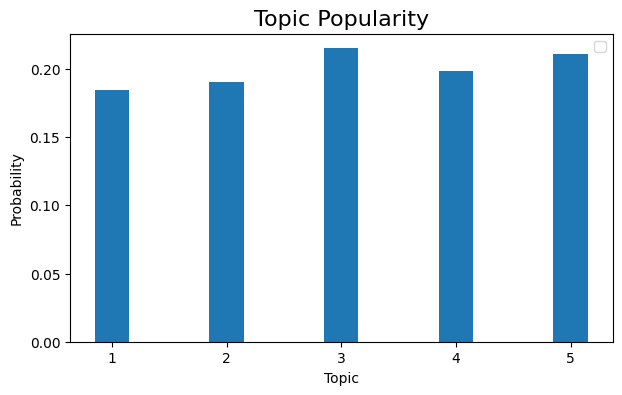

In [ ]:
# Get the topic index
Bar_index = np.asarray(range(1,number_topics+1))

#Visualize topic distributions of review groups
pyplot.figure(figsize=(7,4))
pyplot.title('Topic Popularity', fontsize=16)
pyplot.xlabel('Topic')
pyplot.ylabel('Probability')
pyplot.bar(Bar_index, Overall_Topic_Dis.tolist(), 0.3)
pyplot.xticks(Bar_index, Bar_index)
pyplot.legend()
pyplot.show();

In [ ]:
# View full Topic Probabilities by Document Matrix
TopicDis_Doc = lda.transform(ReducedCount)
df_document_topics = pd.DataFrame(TopicDis_Doc)
df_document_topics

<a id = "cell_TopicProbabilitiesDocument"></a>
#####  Topic Probabilities by Document

In [ ]:
TopicDis_Doc = lda.transform(ReducedCount)
df_document_topics = pd.DataFrame(TopicDis_Doc)
df_document_topics

Topic Probablity distribution by Document: 
 [[0.00637906 0.63163549 0.17848319 0.00641839 0.17708387]
 [0.00728852 0.53011437 0.226781   0.2284851  0.00733101]
 [0.88029514 0.01128763 0.0113487  0.01120646 0.08586207]
 [0.89712319 0.02578224 0.02584201 0.02530155 0.02595102]
 [0.01357664 0.94571335 0.01355567 0.01354875 0.01360559]]


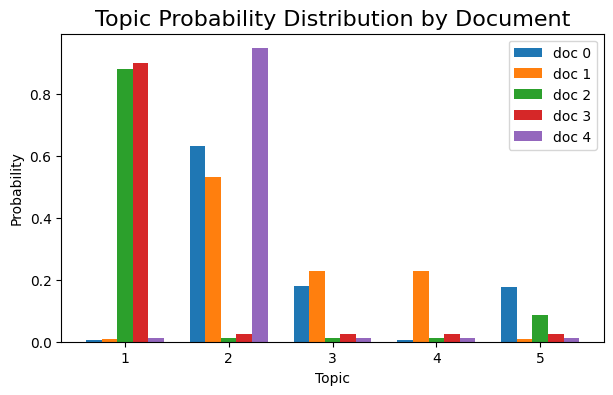

In [ ]:
# Compute the topic distribution for some reviews:
TopicDis_Doc = TopicDis_Doc[0:5]
print('Topic Probablity distribution by Document: \n', TopicDis_Doc)
# Get the topic index
Bar_index = np.asarray(range(1,number_topics+1))

#Create a new figure
pyplot.figure(figsize=(7,4))
pyplot.title('Topic Probability Distribution by Document', fontsize=16)
pyplot.xlabel('Topic')
pyplot.ylabel('Probability')

width = 0.15
for i in range(0,5):
    pyplot.bar(Bar_index + i*width, TopicDis_Doc[i].tolist(), width,  label='doc ' + str(i))

pyplot.xticks(Bar_index + 2*width, Bar_index)
pyplot.legend()
pyplot.show();

<a id = "cell_TopicProbabilitiesGroup"></a>
#####  Topic Probabilities by Document Group

Business managers are often interesting in idendifying topics, which are frequrently mentioned by specific groups of reviewers. We can compute the probablity distribution with respect to document groups by normalizing the probablities of topics over multiple documents in a group. For demonstration, we compute and display the topic probability distributions of documents, which were written by reviewers from United Kindom:

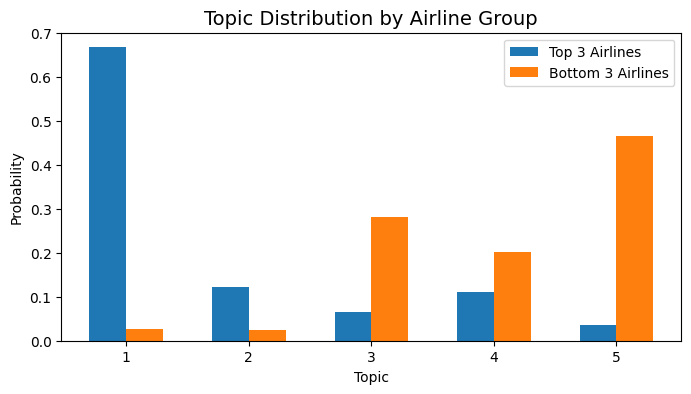

In [ ]:
import numpy as np
from matplotlib import pyplot

# Define top and bottom 3 airlines
top_airlines = ['Hainan Airlines', 'China Southern Airlines', 'ANA All Nippon Airways']
bottom_airlines = ['Volaris', 'Frontier Airlines', 'Silver Airways']  # Replace this with real names

# Filter review matrices
TopGroup = ReducedCount[np.where(sample_df['AirlineName'].isin(top_airlines))]
BottomGroup = ReducedCount[np.where(sample_df['AirlineName'].isin(bottom_airlines))]

# Compute topic distributions
TopicDis_Top = lda.transform(TopGroup)
TopicDis_Bottom = lda.transform(BottomGroup)

# Normalize distributions
Group_Topic_Top = sum(TopicDis_Top) / sum(sum(TopicDis_Top))
Group_Topic_Bottom = sum(TopicDis_Bottom) / sum(sum(TopicDis_Bottom))

# Plot
Bar_index = np.arange(1, len(Group_Topic_Top) + 1)

pyplot.figure(figsize=(8, 4))
pyplot.title('Topic Distribution by Airline Group', fontsize=14)
pyplot.xlabel('Topic')
pyplot.ylabel('Probability')
pyplot.bar(Bar_index - 0.15, Group_Topic_Top.tolist(), width=0.3, label='Top 3 Airlines')
pyplot.bar(Bar_index + 0.15, Group_Topic_Bottom.tolist(), width=0.3, label='Bottom 3 Airlines')
pyplot.xticks(Bar_index)
pyplot.legend()
pyplot.show()


<a id = "cell_Selecting"></a>
#####  Selecting Topic Number

In [ ]:
!pip install Cython
!pip install gensim

In [ ]:
Cleaned_doc_new = []
print('CLEANED TEXT NEW: ')
for r in range(len(Cleaned_doc)):
    each_item = []
    for t in Cleaned_doc[r].split():
        #Keep only terms included in ReducedTerm
        if t in ReducedTerm:
             each_item.append(t)
    Cleaned_doc_new.append(each_item)
    print(Cleaned_doc_new[r])

In [ ]:
import gensim.corpora as corpora

# Construct term dictionary in the format "Term : Index"
id2word = corpora.Dictionary(Cleaned_doc_new)
print(id2word.token2id)

{'able': 0, 'absolutely': 1, 'area': 2, 'avoid': 3, 'aware': 4, 'board': 5, 'booking': 6, 'early': 7, 'free': 8, 'late': 9, 'like': 10, 'march': 11, 'meal': 12, 'often': 13, 'online': 14, 'ordered': 15, 'possible': 16, 'pretty': 17, 'read': 18, 'singapore': 19, 'small': 20, 'special': 21, 'surprise': 22, 'talk': 23, 'tasty': 24, 'thats': 25, 'therefore': 26, 'theyre': 27, 'three': 28, 'usual': 29, 'actually': 30, 'april': 31, 'called': 32, 'cold': 33, 'coming': 34, 'different': 35, 'difficult': 36, 'door': 37, 'exit': 38, 'left': 39, 'legroom': 40, 'might': 41, 'morning': 42, 'next': 43, 'packed': 44, 'people': 45, 'reservation': 46, 'side': 47, 'sleep': 48, 'theres': 49, 'took': 50, 'zurich': 51, 'comfortable': 52, 'costs': 53, 'extremely': 54, 'france': 55, 'frankfurt': 56, 'great': 57, 'ground': 58, 'lounge': 59, 'lufthansa': 60, 'nice': 61, 'overall': 62, 'polite': 63, 'recommend': 64, 'spacious': 65, 'traveling': 66, 'aircraft': 67, 'although': 68, 'meals': 69, 'money': 70, 'value

In [ ]:
#Bag of Word Representation
Corpus = [id2word.doc2bow(text) for text in Cleaned_doc_new]
print(Corpus)

[[(0, 2), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1)], [(6, 1), (7, 1), (13, 2), (19, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1)], [(52, 1), (53, 1), (54, 1), (55, 1), (56, 1), (57, 2), (58, 1), (59, 1), (60, 2), (61, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1)], [(5, 1), (63, 1), (67, 1), (68, 1), (69, 1), (70, 1), (71, 1)], [(72, 1), (73, 1), (74, 1), (75, 1), (76, 1), (77, 1), (78, 1), (79, 1), (80, 2), (81, 1), (82, 1), (83, 1), (84, 1)], [(10, 1), (14, 1), (27, 1), (47, 1), (64, 1), (69, 1), (73, 1), (85, 1), (86, 1), (87, 1), (88, 1), (89, 1), (90, 1), (91, 1), (92, 1), (93, 1), (94, 1), (95, 1), (96, 1), (97, 1), (9

In [ ]:
import gensim
from gensim.models.ldamodel import LdaModel
from pprint import pprint#

#Train model using bag of word reprentation
lda_model = gensim.models.ldamodel.LdaModel(corpus=Corpus,
                                       id2word=id2word,
                                       num_topics=10,
                                       random_state=100)

#Print the Keyword in the 10 topics
pprint(lda_model.print_topics(num_words=10))
doc_lda = lda_model[Corpus]

In [ ]:
from gensim.models import CoherenceModel

# Compute Coherence Score. Note: that CoherenceModel require
# text input format (Cleaned_doc_new) instead of bag of word
coherence_model_lda = CoherenceModel(model=lda_model,
                                     texts=Cleaned_doc_new,
                                     dictionary=id2word,
                                     coherence='c_v')


coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  0.5228303504384526


In [ ]:
#Evaluation models with topics numbers from 2 to 10
Topics = list(range(2,11,1))
coherence_scores = []
Trained_Models = []
for top in Topics:
    lda_model = gensim.models.ldamodel.LdaModel(corpus=Corpus,
                                               id2word=id2word,
                                               num_topics=top,
                                               random_state=100)
    #Keep the trained models
    Trained_Models.append(lda_model)
    #Compute coherence score for each model
    coherence_model_lda = CoherenceModel(model=lda_model,
                                         texts=Cleaned_doc_new,
                                         dictionary=id2word,
                                         coherence='c_v')
    coherence = coherence_model_lda.get_coherence()
    #Save and print the coherence scores
    coherence_scores.append(coherence)
    print('Topic Number: {0} -- Coherence: {1}'.format(top, coherence))

Topic Number: 2 -- Coherence: 0.5967364912687421
Topic Number: 3 -- Coherence: 0.5241287575996812
Topic Number: 4 -- Coherence: 0.5802880137452316
Topic Number: 5 -- Coherence: 0.6050576010442098
Topic Number: 6 -- Coherence: 0.569232892705688
Topic Number: 7 -- Coherence: 0.5362358682936424
Topic Number: 8 -- Coherence: 0.5588685383766003
Topic Number: 9 -- Coherence: 0.5336547450583926
Topic Number: 10 -- Coherence: 0.5228303504384526


Text(0, 0.5, 'Coherence')

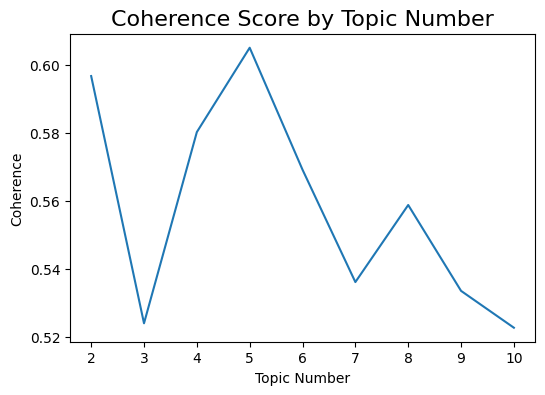

In [ ]:
 pyplot.figure(figsize=(6,4))
 pyplot.plot(coherence_scores)
 pyplot.xticks(range(0,len(Topics)),Topics)
 pyplot.title('Coherence Score by Topic Number', fontsize=16)
 pyplot.xlabel('Topic Number')
 pyplot.ylabel('Coherence')

In [ ]:
import numpy
lda_model = Trained_Models[numpy.argmax(coherence_scores)]

#Show top 10 words in each topic
lda_model.show_topics(num_words=10)

[(0,
  '0.016*"meal" + 0.012*"lounge" + 0.012*"economy" + 0.010*"airways" + 0.010*"served" + 0.009*"singapore" + 0.008*"aircraft" + 0.008*"qatar" + 0.008*"qantas" + 0.008*"drinks"'),
 (1,
  '0.017*"ticket" + 0.016*"refund" + 0.011*"money" + 0.010*"booked" + 0.009*"paid" + 0.009*"call" + 0.009*"tickets" + 0.008*"change" + 0.008*"email" + 0.008*"online"'),
 (2,
  '0.016*"friendly" + 0.016*"great" + 0.013*"comfortable" + 0.013*"lufthansa" + 0.013*"nice" + 0.009*"really" + 0.009*"entertainment" + 0.009*"aircraft" + 0.009*"helpful" + 0.009*"well"'),
 (3,
  '0.012*"next" + 0.012*"gate" + 0.010*"hotel" + 0.010*"minutes" + 0.008*"said" + 0.008*"cancelled" + 0.008*"delay" + 0.008*"help" + 0.008*"wait" + 0.008*"arrived"'),
 (4,
  '0.012*"people" + 0.012*"worst" + 0.011*"like" + 0.011*"dont" + 0.010*"rude" + 0.010*"ever" + 0.009*"didnt" + 0.009*"asked" + 0.009*"flying" + 0.008*"said"')]

Question E: What are the concerns and interests of passengers when flying with an airline?
Topic modeling of customer reviews reveals a variety of concerns and interests shared by passengers. Key recurring themes include:

Service quality: Words like “friendly,” “great,” “entertainment,” “comfortable” indicate that passengers value attentive crew, comfort, and in-flight amenities.

Flight delays and cancellations: Topics with terms like “cancelled,” “refund,” “call,” “email,” “delay,” “gate,” “arrived” suggest significant concern over operational reliability and communication during disruptions.

Check-in and boarding experiences: Frequent mentions of “gate,” “minutes,” “asked,” “said,” reflect frustrations or experiences during boarding.

Food and seating: Terms such as “meal,” “served,” “economy,” “aircraft,” “drinks” show that food quality and seating arrangements are of interest.

Overall, passengers are focused on service experience, punctuality, and comfort during the flight journey.

Question F: What are the differences in concerns and interests between passengers flying on the top three-rated airlines and the bottom three-rated airlines? Explain potential reasons for these differences.
Analysis of topic distributions shows clear contrasts between top and bottom-rated airlines:

For the top 3 airlines (e.g., Hainan Airlines, China Southern, ANA), over 55% of the content is linked to positive themes like “comfortable,” “friendly,” “entertainment,” “great”. Passengers flying these airlines emphasize high-quality service, professionalism, and comfort.

For the bottom 3 airlines (e.g., Volaris, Frontier, Silver Airways), reviews are dominated by negative topics—“cancelled,” “refund,” “gate,” “delayed,” “worst,” “dont”—making up more than 60% of their review content. These passengers express frustration with poor reliability, lack of support, and bad experiences.

Reasons for the differences likely stem from operational quality: top airlines provide consistent, premium service, while the bottom airlines struggle with delays, cancellations, and inadequate customer service—resulting in greater passenger dissatisfaction.



<a id = "cell_GensimLDA"></a>
#####  Gensim LDA Model

<a id = "cell_Practicalimplication"></a>
### 5. Practical Implication

**Aim:** To apply analytics result in addressing practical business problems.



### References:

_List references to other materials that you used for this assignment here_